<a href="https://colab.research.google.com/github/udilaudo/lezioni_galilei/blob/main/grafici.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Laboratorio di Linguistica Computazionale

L'obiettivo di questo laboratorio è prendere confidenza con gli strumenti teorici introdotti nelle ore precedente e metterli in pratica andando ad analizzare un vero corpus di documenti.

Andiamo ad importare le librerie Python e gli oggetti che andremo ad impiegare:
+ useremo la libreria ```GitPython``` per clonare la repository di GitHub contenente i dati;
+ useremo anche i moduli built-in di Python ```os``` e ```shutil``` per interfacciarci con il nostro sistema operativo;
+ ```NLTK``` è la principale libreria di riferimento per il processamento di dati testuali, acronimo di Natural Language Toolkit;
+ per gestire dataframe utilizzeremo invece la libreria ```pandas```;
+ per visualizzare le word clouds dei documenti utilizzeremo la libreria ```wordcloud```;
+ ```matplotlib``` è la principale libreria che utilizzeremo per realizzare figure e grafici;
+ per calcolare la TF-IDF utilizzeremo la libreria ```scikit-learn``` (una libreria con moltissime strumenti di analisi dati e intelligenza artificiale);
+ useremo la libreria ```spacy``` per effettuare Part-of-Speech (PoS) tagging e lemmatizzazione del testi in maniera specifica per la lingua italiana.

In [1]:
import os
import git
import shutil
from nltk.corpus import PlaintextCorpusReader, stopwords
import pandas as pd
from nltk.tokenize import word_tokenize
from nltk import FreqDist
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
import spacy

Nella cartella ```data``` abbiamo raccolto i documenti di testo che vogliamo andare ad analizzare, nel formato ```.txt```, cioè come semplici file di testo. Qui abbiamo raccolto le versioni complete di 3 romanzi italiani:
+ Ultime lettere di Jacopo Ortis (1802) di Ugo Foscolo;  
+ I promessi sposi (1840) di Alessandro Manzoni;
+ La luna e i falò (1950) di Cesare Pavese.
Questi romanzi sono stati scelti affinché i primi due fossero pressappoco contemporanei, mentre il terzo fosse di oltre un secolo posteriore ai primi due. 

La cartella di dati viene scaricata da una repository GitHub ("https://github.com/andreamecchina/lezioni_NLP.git") in cui ho caricati i file di testo, insieme a questo notebook. Andiamo a scaricare questi documenti in locale e a creare la cartella, se non ne esiste già una in questa directory. Facciamo uso di una cartella temporanea che andiamo poi ad eliminare.

In [2]:
if not os.path.exists("./data"):
    repo_path = "./temp"
    git.Repo.clone_from("https://github.com/andreamecchina/lezioni_NLP.git", repo_path)
    shutil.move(os.path.join(repo_path, "data"), "./")
    shutil.rmtree(repo_path)

Andiamo a specificare il percorso in cui abbiamo raccolti i file di testo in questione e andiamo ad importarli usando l'oggetto ```PlaintextCorpusReader```. Questo oggetto permette di leggere uno alla volta tutti i file nel formato ```.txt``` all'interno del percorso che abbiamo specificato.

In [3]:
corpus = PlaintextCorpusReader("./data", r".*\.txt")

Questo oggetto è in grado, internamente, di processare uno alla volta ogni file di testo del nostro corpus e di tokenizzare, ovvero di dividere in parole, ciascun file di testo.

Il metodo ```fileids``` dell'oggetto ```PlaintextCorpusReader``` ci restituisce una lista dei testi che sono stati identificati dalla libreria. Verifichiamo che questi siano correttamente i tre file che sono contenuti nella cartella di input.

In [4]:
files = corpus.fileids()
print(files)

['i_promessi_sposi.txt', 'la_luna_e_i_falò.txt', 'ultime_lettere_di_jacopo_ortis.txt']


Andiamo a creare un dataframe ```parsing``` in cui riportare delle statistiche basilari per ciascuno documento del corpus che abbiamo costruito. In particolare, per ciascun documento andiamo a riportare il numero di paragrafi, di frasi e di parole, utilizzando i metodi relativi dell'oggetto ```PlaintextCorpusReader```.

Vediamo che I promessi sposi è il romanzo più lungo dei 3, con il maggior numero di parole e, prevedibilmente, di frasi e di parafrafi. I conteggi per La luna e i falò e Ultime lettere di Jacopo Ortis non sono invece così diversi.

In [5]:
names = ["I promessi sposi", "La luna e i falò", "Ultime lettere di Jacopo Ortis"]
parsing = pd.DataFrame(index=names)
parsing["Paragrafi"] = [len(corpus.paras(fileids=file)) for file in files]
parsing["Frasi"] = [len(corpus.sents(fileids=file)) for file in files]
parsing["Parole"] = [len(corpus.words(fileids=file)) for file in files]
display(parsing)

,Paragrafi,Frasi,Parole
I promessi sposi,3005,10439,282255
La luna e i falò,680,2673,52596
Ultime lettere di Jacopo Ortis,535,2577,60174


Una visualizzazione utile della frequenza dei token, che nel nostro caso corrispondono alle parole del testo, è attraverso le cosiddette word cloud, o nuvole di parole. In questo tipo di figure, più grande appare una parola, maggiore è la sua frequenza nel documento considerato.

Andiamo quindi a calcolare un dizionario con le frequenze dei token in ciascuno dei tre testi a disposizione.

Mentre la divisione in paragrafi e frasi è, almeno in linea di principio, indipendente dalla lingua del documento, ci possiamo aspettare che invece la tokenizzazione dipenda dalla lingua delle parole. A tal proposito, vogliamo applicare ora una tokenizzazione specifica per la lingua italiana e non più quella inglese, applicata di default dal metodo usato in precedenza.

Andiamo ad utilizzare la funzione ```word_tokenize``` per creare, per ciascun documento, una lista dei token. Usiamo un metodo `dell'oggetto ```PlaintextCorpusReader``` per ottenere restituisce il documento grezzo, così da poterci applicare una tokenizzazione specifica per la lingua italiana. Andiamo a convertire tutti i token in minuscolo.

In [6]:
tokens = {
    name: word_tokenize(corpus.raw(file).lower(), language="italian")
    for name, file in zip(names, files)
}

Andiamo poi ad utilizzare il metodo ```FreqDist``` per calcolare la distribuzione dei token che abbiamo appena ottenuto per ciascun romanzo.

In [7]:
tokens_freqs = {name: FreqDist(tokens[name]) for name in names}

Andiamo ora a realizzare un grafico word cloud per il testo de I promessi sposi, partendo dalla tokenizzazione appena ottenuta. 

Quello che possiamo osservare è che, nonostante compaiano alcune parole tipiche del romanzo in questione, le parole più grandi, dunque le più frequenti, sono parole molto comuni che non hanno alcun contenuto informativo riguardo al romanzo in questione.

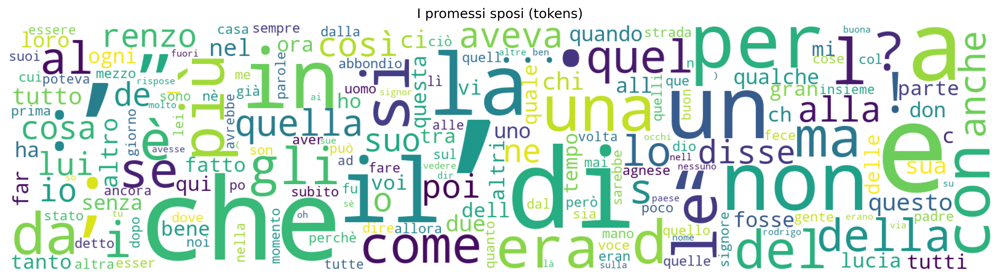

In [8]:
fig, ax = plt.subplots(figsize=(16, 4), dpi=300)
ax.set_title("I promessi sposi (tokens)")
ax.imshow(
    WordCloud(
        width=1600, height=400, background_color="white"
    ).generate_from_frequencies(tokens_freqs["I promessi sposi"])
)
ax.axis("off")
plt.show()

Le parole di uso comune, a basso contenuto informativo, sono dette stop words. Queste sono proprio di ciascuna lingua e una lista di quelle proprie della lingua italiana è disponibile tramite il metodo ```words``` di un oggetto adibito che abbiamo importato.

In [9]:
stop_words = set(stopwords.words("italian"))
print(stop_words)

{'una', 'saranno', 'avranno', 'l', 'essendo', 'farete', 'sarete', 'ero', 'facemmo', 'stavate', 'sto', 'cui', 'fosse', 'dai', 'starei', 'feci', 'starebbero', 'dal', 'nostro', 'nostri', 'hanno', 'abbiano', 'dallo', 'foste', 'mie', 'farai', 'vostro', 'avuta', 'quale', 'quanto', 'noi', 'ci', 'a', 'avrò', 'avendo', 'e', 'sugli', 'anche', 'quante', 'dov', 'del', 'ebbe', 'sarà', 'facevo', 'vostri', 'faccia', 'starai', 'stavamo', 'questo', 'erano', 'fareste', 'stesti', 'starà', 'avesti', 'sono', 'sareste', 'avessero', 'siate', 'furono', 'eravate', 'fummo', 'avemmo', 'avessi', 'stava', 'ad', 'sullo', 'tutto', 'col', 'avrebbero', 'fossimo', 'avrete', 'nella', 'fossero', 'fanno', 'avessimo', 'tuoi', 'staranno', 'stareste', 'faccio', 'farebbe', 'stetti', 'dall', 'eri', 'fui', 'dalle', 'faresti', 'li', 'sarò', 'chi', 'stai', 'sta', 'agl', 'all', 'loro', 'al', 'ho', 'avete', 'facciano', 'stesse', 'si', 'facessi', 'delle', 'negl', 'ti', 'ne', 'degli', 'sarebbe', 'fai', 'ma', 'miei', 'sulla', 'facessi

Queste parole sono tipiche della lingua italiana moderna e contemporanea e quindi ci aspettiamo che siano adeguate per analizzare i nostri documenti, tutti successivi al 1800. Per documenti di parecchi secoli precedenti, forse queste stop words non sarebbero state adeguate.

Andiamo adesso a rimuovere le stop words dalle tokenizzazioni dei 3 documenti che abbiamo ottenuto prima. Andiamo anche a scartare tutto ciò che non è un carattere alfanumerico, come per esempio simboli di spaziatura e quant'altro. Successivamente, andiamo a calcolare la frequenza di frequenza dei token dopo aver eliminato le stop words.

In [10]:
cleaned_tokens = {
    name: [word for word in tokens[name] if word.isalnum() and word not in stop_words]
    for name in names
}
cleaned_tokens_freqs = {name: FreqDist(cleaned_tokens[name]) for name in names}

Per confronto, andiamo adesso a realizzare un grafico word cloud per con la nuova lista di token, dopo aver eliminato le stop words.

Nonostante rimangano ancora alcune parole e lemmi poco informativi riguardo al romanzo, da questa word cloud è possibile risalire al romanzo in questione: in questo modo, questa figura diventa un utile strumento di sintesi di un documento anche molto esteso, come in questo caso.

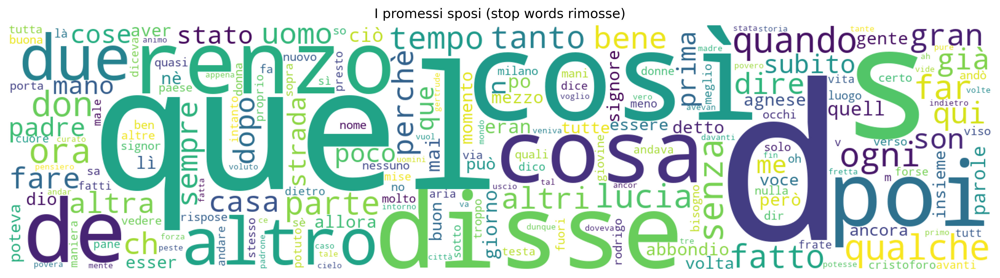

In [11]:
fig, ax = plt.subplots(figsize=(16, 4), dpi=300)
ax.set_title("I promessi sposi (stop words rimosse)")
ax.imshow(
    WordCloud(
        width=1600, height=400, background_color="white"
    ).generate_from_frequencies(cleaned_tokens_freqs["I promessi sposi"])
)
ax.axis("off")
plt.show()

Sempre per un confronto, andiamo adesso a realizzare la figura relativa a La luna e i falò. La figura presenta termini più frequenti decisamente diversi rispetto a I promessi sposi, caratterizzando quindi in maniera diversa i due romanzi.

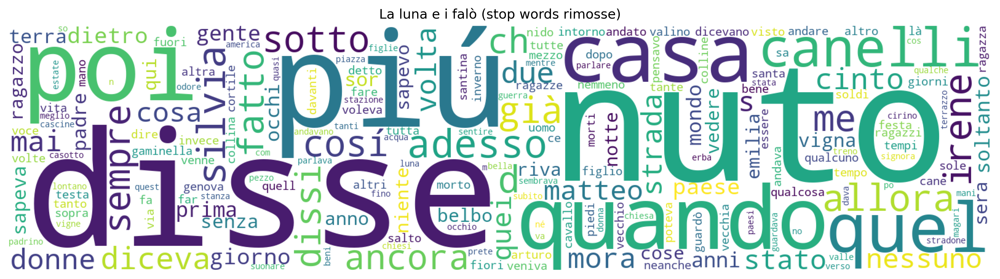

In [12]:
fig, ax = plt.subplots(figsize=(16, 4), dpi=300)
ax.set_title("La luna e i falò (stop words rimosse)")
ax.imshow(
    WordCloud(
        width=1600, height=400, background_color="white"
    ).generate_from_frequencies(cleaned_tokens_freqs["La luna e i falò"])
)
ax.axis("off")
plt.show()

Riportiamo infine la stessa figura anche per l'ultimo documento considerato, Ultime lettere di Jacopo Ortis. Restano valide tutte le considerazioni fatte precedentemente: emergono dalla word cloud alcune parole chiave, caratterizzanti questo romanzo.

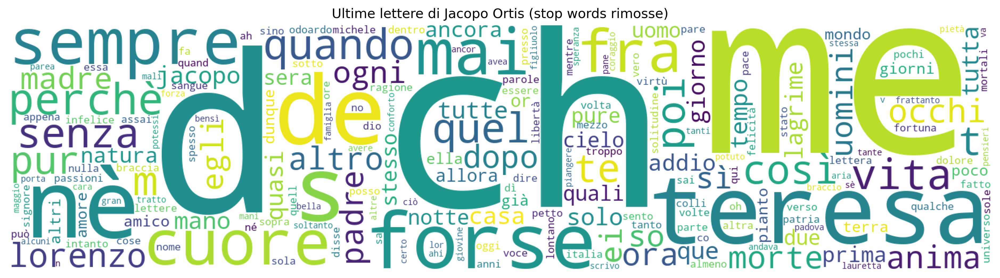

In [13]:
fig, ax = plt.subplots(figsize=(16, 4), dpi=300)
ax.set_title("Ultime lettere di Jacopo Ortis (stop words rimosse)")
ax.imshow(
    WordCloud(
        width=1600, height=400, background_color="white"
    ).generate_from_frequencies(cleaned_tokens_freqs["Ultime lettere di Jacopo Ortis"])
)
ax.axis("off")
plt.show()

Le word clouds che abbiamo appena visto visualizzano con un carattere più grande le parole, tolte le stop words, con la maggiore frequenza in ciascun documento. Un'altra misura interessante che possiamo andare a considerare al posto della frequenza è la TF-IDF, che va a considerare anche quanto ciascuna parola è caratteristica di ciascun documento.

Andiamo di seguito a creare l'oggetto ```TfidfVectorizer``` e a costruire la matrice dei valori TF-IDF.

In [14]:
vectorizer = TfidfVectorizer()
TF_IDF_matrix = vectorizer.fit_transform(
    [" ".join(tokens) for tokens in cleaned_tokens.values()]
).todense()

Adesso che abbiamo un unico oggetto matriciale che contiene tutti i pesi, andiamo ad oranizzarli in un dizionario con tre ingressi, uno per ciascun documento del nostro corpus.

In [15]:
TF_IDF_weights = {}
for index, name in enumerate(names):
    TF_IDF_values = TF_IDF_matrix[index].tolist()[0]
    TF_IDF_weights[name] = dict(zip(vectorizer.get_feature_names_out(), TF_IDF_values))

Possiamo andare adesso a visualizzare le word clouds che otteniamo in questo modo, quindi dove la dimensione delle parole è data dal valore di TF-IDF e non più dal solo valore di frequenza (che indichiremmo in questo contesto con TF).

Vediamo che in questo modo, emergono ancora di più termini relativi propriamente al documento considerato.

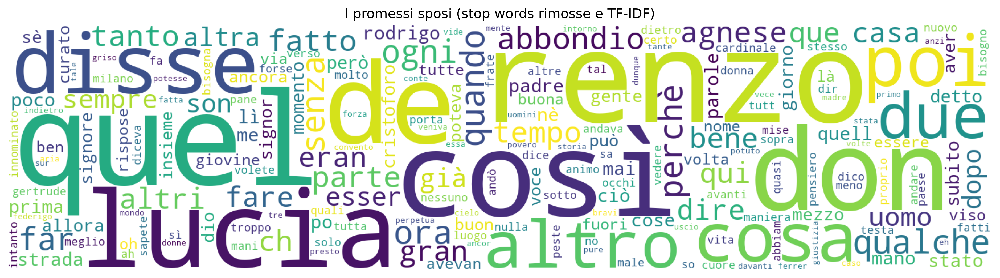

In [16]:
fig, ax = plt.subplots(figsize=(16, 4), dpi=300)
ax.set_title("I promessi sposi (stop words rimosse e TF-IDF)")
ax.imshow(
    WordCloud(
        width=1600, height=400, background_color="white"
    ).generate_from_frequencies(TF_IDF_weights["I promessi sposi"])
)
ax.axis("off")
plt.show()

Riportiamo di seguito la word cloud anche per La luna e i falò, in cui vediamo che sembrano apparire più grandi i termini più caratterizzanti del documento in questione.

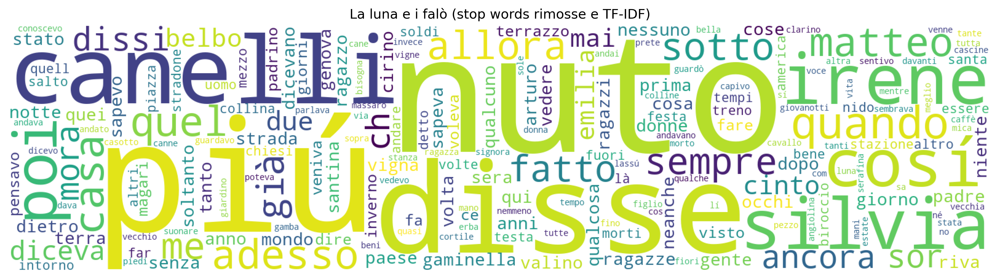

In [17]:
fig, ax = plt.subplots(figsize=(16, 4), dpi=300)
ax.set_title("La luna e i falò (stop words rimosse e TF-IDF)")
ax.imshow(
    WordCloud(
        width=1600, height=400, background_color="white"
    ).generate_from_frequencies(TF_IDF_weights["La luna e i falò"])
)
ax.axis("off")
plt.show()

Infine, nella figura successiva riportiamo la word cloud ottenuta tramite TF-IDF anche per il romanzo Ultime lettere di Jacopo Ortis. Anche qui, questo sistema di peso delle parole, più accurato della semplice frequenza dei token, sembra avere un impatto positivo.

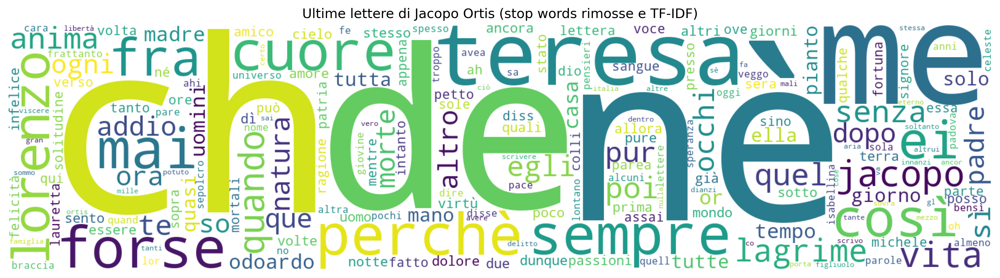

In [18]:
fig, ax = plt.subplots(figsize=(16, 4), dpi=300)
ax.set_title("Ultime lettere di Jacopo Ortis (stop words rimosse e TF-IDF)")
ax.imshow(
    WordCloud(
        width=1600, height=400, background_color="white"
    ).generate_from_frequencies(TF_IDF_weights["Ultime lettere di Jacopo Ortis"])
)
ax.axis("off")
plt.show()

Per effettuare il PoS tagging e la lemmatizzazione dobbiamo scaricare un modello specificatamente addestrato sulla lingua italiana. Abbiamo a disposizione un modello chiamato ```it_core_news_sm```, che nello specifico è stato allenato a partire da notizie giornalistiche. 

Il codice di seguito scarica il modello se questo non è già stato scaricato in precedenza, altrimenti si limita a caricarlo. Andiamo poi a creare un oggetto ```nlp``` che useremo per effettuare il PoS tagging e per la lemmatizzazione.

In [19]:
try:
    nlp = spacy.load("it_core_news_sm")
except ModuleNotFoundError:
    spacy.cli.download("it_core_news_sm")
    nlp = spacy.load("it_core_news_sm")

D'ora in poi lavoreremo sempre sui documenti da cui abbiamo rimosso le stop words. Siccome il limite di caratteri di default di ```spacy``` è di $1000000$, per essere sicuri di non eccedere questo limite, lo impostiamo uguale al numero token (eliminando le stop words) de I promessi sposi, in quanto questo è il documento più lungo tra quelli considerati.

In [20]:
nlp.max_length = len(" ".join(cleaned_tokens["I promessi sposi"]))
print(nlp.max_length)

882961


Possiamo adesso effettuare il PoS tagging e la lemmatizzazione dei nostri tre documenti. Per ciascuno, andiamo a creare un dataframe con tante righe quanti sono gli elementi del testo processato e tre colonne: 
+ la prima conterrà i token del testo originali;
+ la seconda conterrà i lemmi delle parole riconosciuto dall'algoritmo di lemmatizzazione;
+ la terza conterrà gli elementi logici del discorso riconosciuti dall'algoritmo di PoS;

Andiamo poi a salvare i dataframe ottenuti come elementi di un dizionario. Queste operazioni possono richiedere un po' di tempo.

In [21]:
part_of_speech_tags = {}
for name in names:
    print(f"{name}...")
    doc = nlp(" ".join(cleaned_tokens[name]))
    part_of_speech_tags[name] = pd.DataFrame(
        [(token.text, token.lemma_, token.pos_) for token in doc],
        columns=["Token", "Lemma", "PoS"],
    )

I promessi sposi...
La luna e i falò...
Ultime lettere di Jacopo Ortis...


I valori possibili degli elementi logici identificati dall'algoritmo di PoS tagging sono in numero limitato. Questi valori sono riportati nella documentazione di  ```spacy``` (accessibile al link: https://universaldependencies.org/u/pos/) e per comodità li riportiamo anche di seguito:
| Tag | Parte del discorso       |
|-----------|--------------------------|
| ADJ       | Aggettivo                |
| ADP       | Apposizione              |
| ADV       | Avverbio                 |
| AUX       | Ausiliare                |
| CCONJ     | Congiunzione Coordinante |
| DET       | Articolo Determinativo   |
| INTJ      | Interiezione             |
| NOUN      | Nome                     |
| NUM       | Numero                   |
| PART      | Particella               |
| PRON      | Pronome                  |
| PROPN     | Nome Proprio             |
| PUNCT     | Punteggiatura            |
| SCONJ     | Congiunzione Subordinante|
| SPACE     | Spazio                   |
| SYM       | Simbolo                  |
| VERB      | Verbo                    |
| X         | Altro                    |


Possiamo andare anche a visualizzare la distribuzione di frequenza dei tag ottenuti dall'algoritmo di PoS tagging. Andiamo a costuire un dataframe con le frequenze, per ciascun documento, dei diversi tag che abbiamo individuato. 

In [22]:
tag_frequencies = pd.DataFrame(columns=names)
for name in names:
    tag_frequencies[name] = part_of_speech_tags[name]["PoS"].value_counts(
        normalize=True
    )
tag_frequencies.fillna(0.0, inplace=True)
display(tag_frequencies)

,I promessi sposi,La luna e i falò,Ultime lettere di Jacopo Ortis
PoS,,,
NOUN,0.268633,0.285340,0.278018
VERB,0.257270,0.288396,0.245532
ADJ,0.163618,0.161879,0.185703
ADV,0.102403,0.091854,0.096644
AUX,0.044003,0.042784,0.031857
ADP,0.041545,0.029337,0.039997
DET,0.037457,0.028159,0.028601
PROPN,0.026532,0.028115,0.021793
PRON,0.026507,0.021392,0.029822


Possiamo andare a visualizzare un grafico a barre per confrontare a colpo d'occhio le divese frequenze nei tre documenti considerati, in modo da catturare anche sottili differenze negli stili della scrittura dei diversi autori.

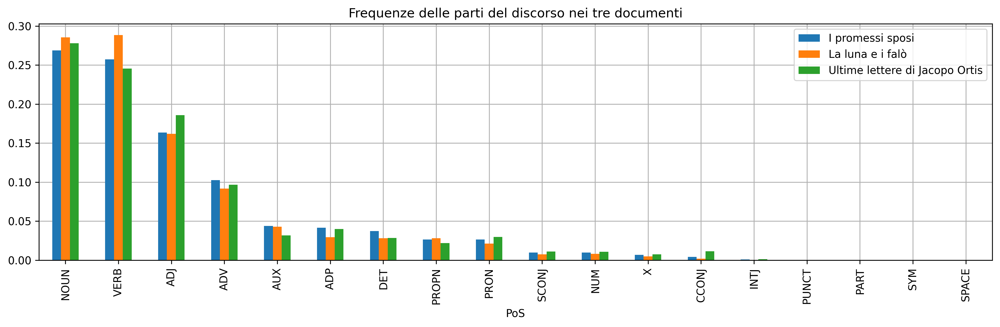

In [23]:
fig, ax = plt.subplots(figsize=(16, 4), dpi=300)
ax.set_title("Frequenze delle parti del discorso nei tre documenti")
tag_frequencies.plot(kind="bar", zorder=2, ax=ax)
ax.grid()
plt.show()